# Building a NHL Playoff Contender
#### Making Money with Data Summer 2020 Session Final Project
#### Dan Kahn

## Project Description
It is said that every NHL season is actually comprised of two seasons:  the Regular Season and the Post Season.  To win the championship, a team has to first perform well enough in the Regular Season, and then win the Post Season.  This project deals with the first part of this process:  performing well enough in the Regular Season.

This project will analyze past season NHL team data to create a model to predict the number of points a team is expected to earn. This model will prescribe what type(s) of players a team should pursue through trade or free agency to maximize probability of qualifying for the Post Season.  

To maximize the probability of qualifying for the Post Season, a team needs to maximize the number of "points" it accumulates.  Two points are awarded for winning a game, and one point is awarded for losing in overtime or shootout.

It is clear that simply having the best player on the team is not enough to win the Stanley Cup.  There are ample examples of some of the best players in the league not even making it to the playoffs, let alone winning it all.

## Methodology
### Data Collection
NHL Team data for the last 10 complete seasons (2009-2010 through 2018-2019) will be collected the official NHL stats API website:  _http://statsapi.web.nhl.com_.  Use of this API is described in the README at _https://github.com/dword4/nhlapi_.

### Data Cleaning
From the team data, columns that do not add to the model will be dropped:  'name', 'teamName', 'locationName', 'venue', 'division', 'conference', 'franchise', 'shortName', and 'officialSiteUrl'.  

Furthermore, the data will be examined to confirm the statistics are given in common units.  For example, percentages should be in either ranges of 0 to 1 or 0 to 100.  Otherwise, some percentages will appear to be more important than others.

Finally, the following stats will be omitted from the analysis a priori, since their relationship to the dependent variable is pre-defined.

| Stat | Description | Analysis Handling |
| ---- | ----------- | -------- |
| **'gamesPlayed'** | Number of games played in the regular season. | Omit from analysis, since this will be the same for all teams |
| **'wins'** | Number of regular season wins (worth 2 points). | Omit from analysis, since this is a component of the dependent variable ('pts'). |
| **'losses'** | Number of regular season losses in regulation (worth 0 points). | Omit from analysis, since this does not contribute to the dependent variable ('pts'). |
| **'ot'** | Number of regular season losses in overtime or shootout (worth 1 point). | Omit from analysis, since this is a component of the dependent variable ('pts'). |
| **'ptPctg'** | Percent of possible points earned.  (= 'pts' / (2 x 'gamesPlayed')) | Omit from analysis, since this value is derived from the dependent variable and a constant. |

### Data Integration
The team data from the NHL contains fields with vastly differnt scales. How the team stats that the NHL makes available will be integrated into this analysis is described in table below.

| Stat | Description | Analysis Handling |
| ---- | ----------- | -------- |
| **'pts'** | What needs to be maximized to reach playoffs (= 2 x 'wins' + 1 x 'ot'). | This is the DEPENDENT variable! |
| **'goalsPerGame'** | Mean number of goals the team scored per game. | Potential INDEPENDENT variable. |
| **'goalsAgainstPerGame'** | Mean number of goals the team surrendered per game. | Potential INDEPENDENT variable. |
| **'evGGARatio'** | Exact definition of the is stat is unknown, but it is provide so it will be analyzed. | Potential INDEPENDENT variable. |
| **'powerPlayPercentage'** | Number of power play goals per power play opportunities (= 100 x 'powerPlayGoals' / 'powerPlayOpportunities').  Value in range 0 to 100. | Potential INDEPENDENT variable. |
| **'powerPlayGoals'** | Number of power play goals team scored. | Potential INDEPENDENT variale. |
| **'powerPlayGoalsAgainst'** | Number of power play goals team surrendered. | Potential INDEPENDENT variable. |
| **'powerPlayOpportunities'** | Number of power plays team drew. | Potential INDEPENDENT variable. |
| **'penaltyKillPercentage'** | Number of successful pentalty kills per penalties taken (= 100 x (1 - 'powerPlayGoalsAgainst' / 'penaltyKillOpportunities')).  Value in range 0 to 100. | Potential INDEPENDENT variable. |
| **'shotsPerGame'** | Mean number of shots on goal per game. | Potential INDEPENDENT variable. |
| **'shotsAllowed'** | Mean number of shots on goal allowed per game. | Potential INDEPENDENT variable. |
| **'winScoreFirst'** | Number of wins when team scores first per games played.  Value in range 0 to 1. | Potential INDEPENDENT variable. |
| **'winOppScoreFirst'** | Number of wins when opponent scores first per games played.  Value in range 0 to 1. | Potential INDEPENDENT variable. |
| **'winLeadFirstPer'** | Number of wins when team leads after first period per games played.  Value in range 0 to 1. | Potential INDEPENDENT variable. |
| **'winLeadSecondPer'** | Number of wins when team leads after second period per games played.  Value in range 0 to 1. | Potential INDEPENDENT variable. |
| **'winOutshootOpp'** | Number of wins when team outshoots opponent per games played.  Value in range 0 to 1. | Potential INDEPENDENT variable. |
| **'winOutshotByOpp'** | Number of wins when opponent outshoots team per games played.  Value in range 0 to 1. | Potential INDEPENDENT variable. |
| **'faceOffsTaken'** | Total number of faceoffs team taken. | Potential INDEPENDENT variable.  |
| **'faceOffsWon'** | Number of faceoffs team won. | Potential INDEPENDENT variable. |
| **'faceOffsLost'** | Number of faceoffs team lost. | Potential INDEPENDENT variable. |
| **'faceOffWinPercentage'** | Faceoffs won per faceoffs taken (= 100 x 'faceOffsWon' / 'faceOffsTaken').  Value in range 0 to 100. | Potential INDEPENDENT variable. |
| **'shootingPctg'** | Percentage of shots on net taken by a player that result in a goal.  Value in range 0 to 100. | Potential INDEPENDENT variable. |
| **'savePctg'** | Shots goalie saved per shots goalie faced.  Value in range 0 to 1.  | Potential INDEPENDENT variable. |


### Data Analysis 
First the parameters will be displayed in a pair-plot, to visually inspect for non-normal behavior.  Based on this inspection, the data will be further conditioned.

Next, the Ordinary Least Squares (OLS) technique will be used to build a points predition model.  Both the full data and conditioned data will be used to create models.  Characteristics of these models, and the root mean squares error between actual and predicted points, will show how well each model performs.

If the OLS model for the best performing model indicates collinearities, additional data conditioning will be performed to attempt to alleviate.  Some degree of collinearity is expected in a model that attempts to quantify unmeasurable quantities.


### Conclusions
Finally, the best model will be selected, and conclusions drawn based on it.

### _References_
The website https://towardsdatascience.com/nhl-analytics-with-python-6390c5d3206d has been used as a starting point for this project.

Information about NHL data API:  https://github.com/dword4/nhlapi.

In [1]:
import requests
import pandas          as pd
import numpy           as np
import statsmodels.api as sm
from statsmodels.tools.eval_measures      import rmse
from statsmodels.stats.outliers_influence import variance_inflation_factor
import seaborn as sns
import matplotlib.pyplot as plt

## Data Collection

First define some methods that extract data from the NHL web API into a data frame for analysis.  These methods are created to break-up the steps for code readability.

In [2]:
# define a method that shortens 'pd.DataFrame.from_records'.  Strictly for readability.
def json_to_df(x):
    return pd.DataFrame.from_records(x)

In [3]:
# The NHL has an API method that returns a summary of teams who participated in each season.  This
# method pulls this data for a prescribed season.
def getTeamsSeasonGeneralData(season):
    #
    # Get the data from the API, and extract the portion of the JSON structure containing the team data.
    r  = requests.get(url='http://statsapi.web.nhl.com/api/v1/teams?season='+season)
    df = json_to_df( json_to_df( r.json() ).teams.values ).set_index('id')
    #
    # Condition the general team data by dropping extraneous columns, and creating other useful columns.
    df.drop(columns=['name','teamName','locationName','venue','division','conference','franchise','shortName','officialSiteUrl'], inplace=True)
    df['season']          = season
    df['clinchIndicator'] = np.NaN

    return df

In [4]:
# The NHL provides an API to get detailed season stats for each team.  Since these stats need to be
# retrieved on a team-by-team basis, the columns need to be created first, and populated later.
# This method only creates the columns, and initializes them to zeros.  This method only needs to be 
# called once.
def addTeamStatsColumns(df, season):
    #
    # Get the data from the API, and extract the portion of the JSON structure containing the team data.
    r    = requests.get(url='http://statsapi.web.nhl.com'+df.link.iloc[0]+'/stats?season='+season)
    temp = json_to_df( json_to_df( json_to_df( json_to_df( r.json() ).stats ).splits[0] ).stat )
    #
    # Create the stat columns, initialize them to zeros, and set their data types to 'float64'
    for col in temp.columns:
        df[col] = 0.
        df[col] = df[col].astype('float64')

    return df
    

In [5]:
# This method loops over all the teams in the input data frame, and populates their stats columns.
def getTeamsSeasonStats(df, season):
    for i in df.index:
        #
        # Get the data from the API, and extract the portion of the JSON structure containing the team data.
        r = requests.get(url='http://statsapi.web.nhl.com'+df.link.loc[i]+'/stats?season='+season)
        temp = json_to_df( json_to_df( json_to_df( json_to_df( r.json() ).stats ).splits[0] ).stat )
        #
        # Set the temporary dataframe's index to match the current row, and ensure all the stats are
        # stored as 'float64'
        temp.set_index([pd.Index([i])], inplace=True)
        for col in temp.columns:
            temp[col] = temp[col].astype('float64', errors='raise')
        #
        # Update the stats into the resulting dataframe
        df.update(temp)

    return df


In [6]:
# The NHL provides a single API to retrieve which teams qualified for the Playoffs each season, but
# the format of this data varies based on how the NHL determines which teams qualified.  (The top four
# teams in each division used to qualify, but that led to some stronger teams not qualifying because 
# they were in an exceptionally good division.  Now, the top three teams in each division qualify, 
# followed by the next two wild card teams from either division.)
def markPlayoffTeams(df, season):
    #
    # Get the data from the API, and extract the portion of the JSON structure containing the 
    # playoff qualification data.
    r      = requests.get(url='https://statsapi.web.nhl.com/api/v1/standings/wildCardWithLeaders?season='+season)
    temp   = json_to_df( json_to_df( json_to_df( r.json() ).records ).teamRecords )
    #
    # Form a matrix of flags indicating which dataframe locations contain data
    toread = temp.notna()
    #
    # Populate data from the retrieved data into each teams's 'clinchIndicator' column.
    for i in temp.index:
        for col in temp.columns:

            if not toread.loc[i][col]:
                continue
                
            teamID = temp.loc[i][col]['team']['id']

            if any('clinchIndicator' in d for d in temp.loc[i][col]):
                df.loc[teamID,'clinchIndicator'] = 1
            else:
                df.loc[teamID,'clinchIndicator'] = 0

    return df


In [9]:
# Define the first and last years to include in the analysis.
min_year  = 2009
max_year  = 2019
teamsData = pd.DataFrame()

for year in range(min_year,max_year):
    #
    # NHL defines its season as the concatenation of the start and end years of the season.  For 
    # example, the current season started in 2019, and will end in 2020, so the season is 20192020.
    season = str(year)+str(year+1)
    if year > min_year:
        # After the first year, concatenate each successive season's data with the accumulated data.
        teamsData = pd.concat([teamsData, getTeamsSeasonGeneralData(season)])
    else:
        # On the first year, establish the team data dataframe, including the stat columns.
        teamsData = getTeamsSeasonGeneralData(season)
        teamsData = addTeamStatsColumns(teamsData.copy(), season)
    #
    # For all years, get the team detailed stats, and mark which teams qualified for the playoffs.
    this_season = teamsData.season == season
    teamsData.loc[this_season] = getTeamsSeasonStats(teamsData[this_season].copy(), season)
    teamsData.loc[this_season] = markPlayoffTeams(teamsData[this_season].copy(), season)

## What does the data look like?

In [10]:
# Define the list of columns that will be included in the analysis, and corresponding list of coef
# names
allStatColumns = ['goalsPerGame', 'goalsAgainstPerGame', 'evGGARatio',
       'powerPlayPercentage', 'powerPlayGoals', 'powerPlayGoalsAgainst',
       'powerPlayOpportunities', 'penaltyKillPercentage', 'shotsPerGame',
       'shotsAllowed', 'winScoreFirst', 'winOppScoreFirst', 'winLeadFirstPer',
       'winLeadSecondPer', 'winOutshootOpp', 'winOutshotByOpp',
       'faceOffsTaken', 'faceOffsWon', 'faceOffsLost', 'faceOffWinPercentage',
       'shootingPctg', 'savePctg']
allStatCoefsNames = ['constant'] + allStatColumns

In [11]:
# Define a method for standardizing the team data.  This mostly involves reducing percentages to be
# in the range of 0 to 1, instead of 0 to 100.
def standardizeTeamData(df):
    df.penaltyKillPercentage  = df.penaltyKillPercentage / 100.
    df.powerPlayPercentage    = df.powerPlayPercentage / 100.
    df.faceOffWinPercentage   = df.faceOffWinPercentage / 100.
    df.shootingPctg           = df.shootingPctg / 100.
        
    return df

First, standardize a copy of the retrieved data.  Then generate pair-plots for this data set.

In [12]:
analysisData = standardizeTeamData(teamsData.copy())

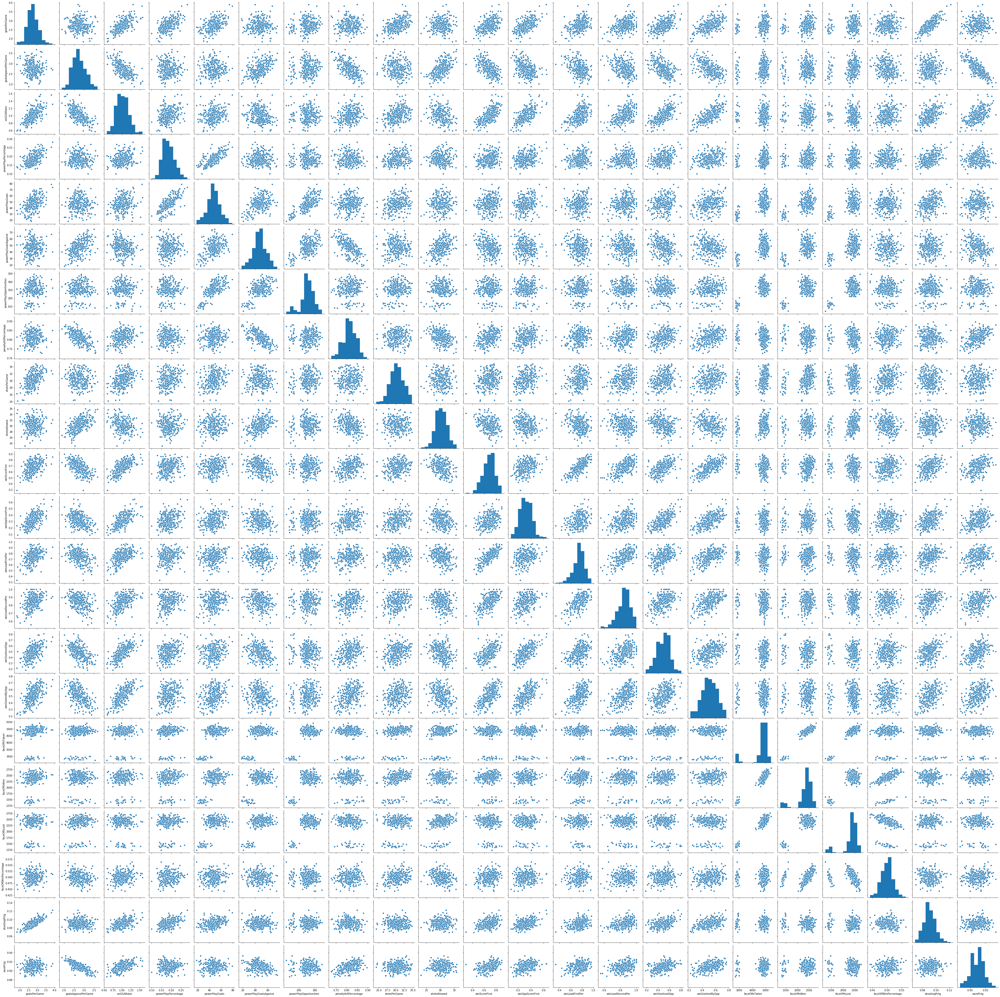

In [13]:
sns.pairplot(analysisData[allStatColumns]);

In examining the pairplot, it is evident that the follow parameters contain gaps:  powerPlayGoalsAgainst, powerPlayGoalsAgainst, powerPlayOpportunities, faceOffsTaken, faceOffsWon, faceOffsLost.  All these parameters measure total numbers per season.  If the season had fewer than 82 games, then these numbers are expected to be far outside the norm.  

Sure enough, the 2012-2013 season was shortened by a lockout.  Only 48 regular season games were played...a little more than half the normal number of games.  This season will throw off the model.  There are two ways of handling this:  omit the 2012-2013 season or divide these parameters by the number of games played each season.

#### What does the data look like if the 2012-2013 season is omitted?

In [14]:
fullSeasons = analysisData.gamesPlayed == 82

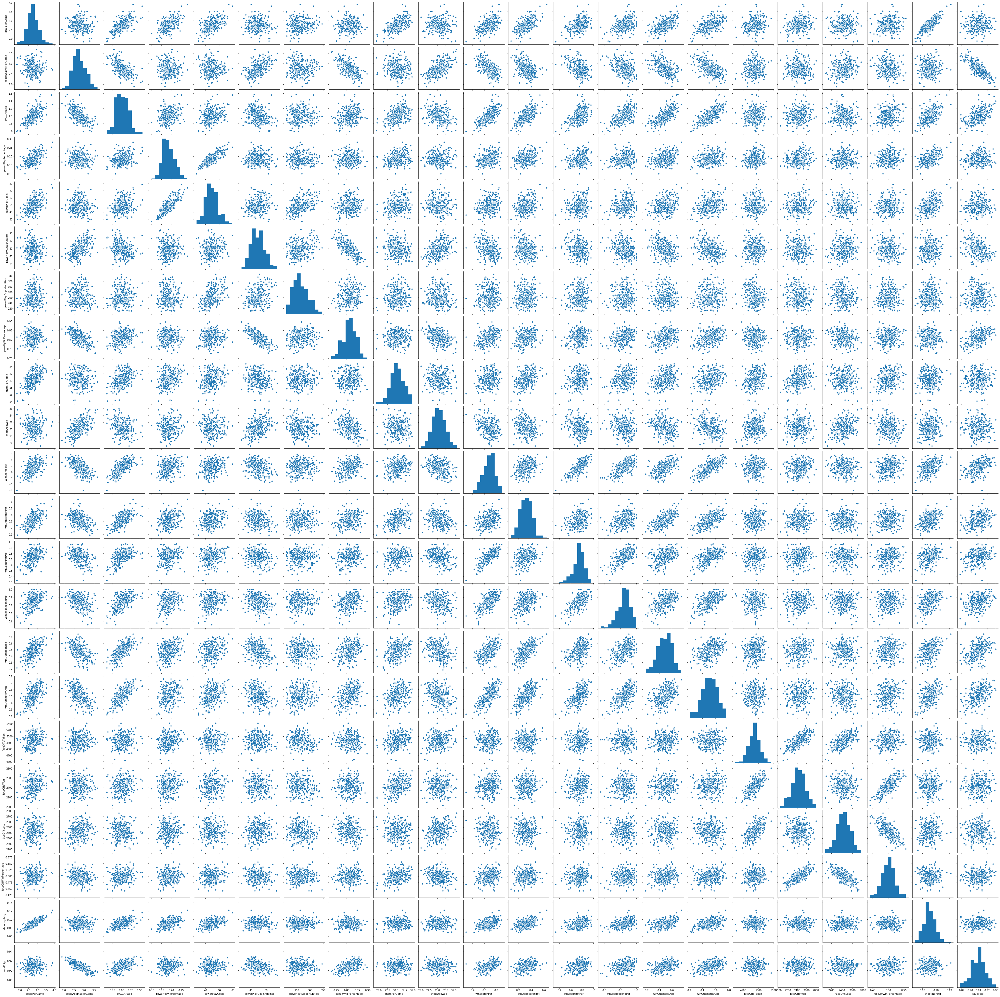

In [15]:
sns.pairplot(analysisData[allStatColumns][fullSeasons]);

By omitting the data from seasons with fewer than 82 games all the parameters appear to be more normalized and centralized.  This seems to be a viable option for handling the data, but it also reduced the number of season over which the analysis will be performed.  If this options is selected, consider pulling additional seasons of data.

#### What does the data look like if the parameters are normalized by the number of games played?

In [16]:
# Define a method for modiefied standardization of the team data.  This mostly involves both 
# reducing percentages to be in the range of 0 to 1, AND normalizing the counts stats by number of 
# games played.
def standardizeTeamData_mod(df):
    df.penaltyKillPercentage  = df.penaltyKillPercentage / 100.
    df.powerPlayPercentage    = df.powerPlayPercentage / 100.
    df.faceOffWinPercentage   = df.faceOffWinPercentage / 100.
    df.shootingPctg           = df.shootingPctg / 100.
    
    df.powerPlayGoalsAgainst  = df.powerPlayGoalsAgainst / df.gamesPlayed
    df.powerPlayOpportunities = df.powerPlayOpportunities / df.gamesPlayed
    df.faceOffsTaken          = df.faceOffsTaken / df.gamesPlayed
    df.faceOffsWon            = df.faceOffsWon / df.gamesPlayed
    df.faceOffsLost           = df.faceOffsLost / df.gamesPlayed
    
    return df

In [17]:
analysisData_mod = standardizeTeamData_mod(teamsData.copy())

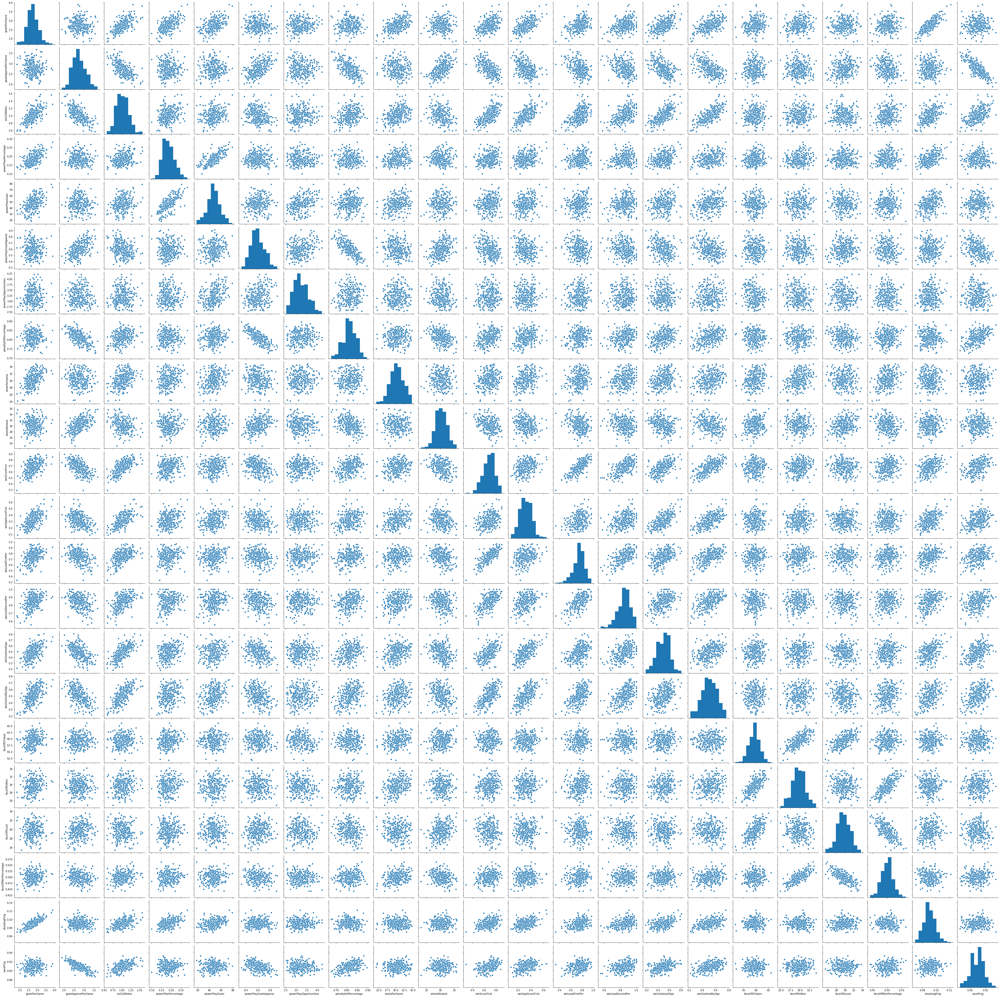

In [18]:
sns.pairplot(analysisData_mod[allStatColumns]);

By normalizing powerPlayGoalsAgainst, powerPlayGoalsAgainst, powerPlayOpportunities, faceOffsTaken, faceOffsWon, and faceOffsLost by the number of games played during the season, all the parameters apear to be more normalized and centralized.

---

## Data Analysis

In [19]:
# Define a method for computing the OLS model fit to the input data using the input columns.
def computeModel(df, cols):
    X = sm.add_constant(df[cols].values)
    Y = df['pts']

    modelFit = sm.OLS(Y, X).fit()
    
    return modelFit

In [20]:
# Compute the model fit for all the available data
model_all      = computeModel(analysisData, allStatColumns)
model_fullOnly = computeModel(analysisData[fullSeasons], allStatColumns)
model_mod      = computeModel(analysisData_mod, allStatColumns)

In [21]:
# Create a dataframe that collects actual, predicted based on all data, predicted based on full seasons
# only, and predicted based on data conditioning mod.
ptsData = pd.DataFrame({'actual'   : teamsData.pts.copy(),
                        'all'      : model_all.predict(),
                        'fullOnly' : np.NaN,
                        'mod'      : model_mod.predict()})

# Predict points using full season only model for full seasons only.  Incomplete seasons' predicted
# points will be NaN.
ptsData.fullOnly[fullSeasons] = model_fullOnly.predict()

# Compute the root sum mean error for each prediction
rsmeData = {}
for col in ptsData.columns:
    rsmeData[col] = rmse(ptsData.actual[ptsData[col].notna()], ptsData[col][ptsData[col].notna()])

In [22]:
# Collect some model statistics into a single dataframe to make it nice to display.
modelComp = pd.DataFrame(
    {'all'     : [model_all.rsquared, 
                  model_all.rsquared_adj, 
                  model_all.rsquared-model_all.rsquared_adj, 
                  model_all.fvalue, 
                  model_all.f_pvalue, 
                  rsmeData['all']],
     'fullOnly': [model_fullOnly.rsquared, 
                  model_fullOnly.rsquared_adj, 
                  model_fullOnly.rsquared-model_fullOnly.rsquared_adj, 
                  model_fullOnly.fvalue, 
                  model_fullOnly.f_pvalue, 
                  rsmeData['fullOnly']],
     'mod'     : [model_mod.rsquared, 
                  model_mod.rsquared_adj, 
                  model_mod.rsquared-model_mod.rsquared_adj, 
                  model_mod.fvalue, 
                  model_mod.f_pvalue, 
                  rsmeData['mod']]},
    index=['rsquared', 'rsquared_adj', 'r_diff', 'fvalue', 'f_pvalue', 'RSME'])
modelComp

,all,fullOnly,mod
rsquared,9.457988e-01,9.640803e-01,9.593209e-01
rsquared_adj,9.417337e-01,9.610630e-01,9.562700e-01
r_diff,4.065091e-03,3.017255e-03,3.050932e-03
fvalue,2.326636e+02,3.195223e+02,3.144354e+02
f_pvalue,1.042495e-163,2.004671e-167,4.235617e-181
RSME,4.121370e+00,2.627684e+00,3.570448e+00


All three models have comprable f-values, and very small f-p-values, which indicate that all three models are reasonable.

However, in comparing the three models' R-squared, adjusted R-squared, and RSME values point so the model that uses only full season data as being the most accurate.  This model has the largest R-squared and adjusted R-squared values, indicating the smallest unknown error sources.  Also, this model has the smallest the differnce between the two values, indicating it is least likely to have too many degrees of freedom for the data available.  Finally, this model's RSME is smallest, indicating it did the best job of predicting season points.

---

### Addressing Known Collinearity

Here is the summary of the full-season-only model.

In [23]:
model_fullOnly.summary(xname=allStatCoefsNames)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    pts   R-squared:                       0.964
Model:                            OLS   Adj. R-squared:                  0.961
Method:                 Least Squares   F-statistic:                     319.5
Date:                Wed, 12 Aug 2020   Prob (F-statistic):          2.00e-167
Time:                        13:13:26   Log-Likelihood:                -648.73
No. Observations:                 272   AIC:                             1341.
Df Residuals:                     250   BIC:                             1421.
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
constant                 217.0267    307.129      0.707      0.480    -387.864     821.917
goalsPerGame              -4.5828      9.507     -0.482      0.630     -23.307      14.142
goalsAgainstPerGame      -23.1165     10.025     -2.306      0.022     -42.861      -3.372
evGGARatio                -0.1618      3.501     -0.046      0.963      -7.058       6.734
powerPlayPercentage        1.2828     59.088      0.022      0.983    -115.092     117.657
powerPlayGoals             0.0442      0.224      0.197      0.844      -0.397       0.486
powerPlayGoalsAgainst      0.0138      0.045      0.310      0.757      -0.074       0.101
powerPlayOpportunities     0.0009      0.042      0.021      0.983      -0.081       0.083
penaltyKillPercentage     -6.0757     11.768     -0.516      0.606     -29.253      17.102
shotsPerGame               1.3932      0.849      1.642      0.102      -0.278       3.065
shotsAllowed               0.9620      0.919      1.046      0.296      -0.849       2.773
winScoreFirst             20.8591      4.475      4.661      0.000      12.046      29.673
winOppScoreFirst          23.9413      3.773      6.345      0.000      16.510      31.373
winLeadFirstPer           -1.9560      2.853     -0.685      0.494      -7.576       3.664
winLeadSecondPer          -7.7966      3.069     -2.541      0.012     -13.840      -1.753
winOutshootOpp            27.9407      3.465      8.064      0.000      21.117      34.764
winOutshotByOpp           26.3152      3.611      7.288      0.000      19.204      33.427
faceOffsTaken             -0.0005      0.001     -0.737      0.462      -0.002       0.001
faceOffsWon               -0.0050      0.024     -0.211      0.833      -0.051       0.041
faceOffsLost               0.0045      0.024      0.189      0.850      -0.042       0.051
faceOffWinPercentage      56.8491    228.481      0.249      0.804    -393.144     506.842
shootingPctg             503.7052    288.341      1.747      0.082     -64.181    1071.592
savePctg                -253.0042    308.948     -0.819      0.414    -861.476     355.468
==============================================================================
Omnibus:                        5.208   Durbin-Watson:                   1.799
Prob(Omnibus):                  0.074   Jarque-Bera (JB):                4.948
Skew:                          -0.279   Prob(JB):                       0.0843
Kurtosis:                       3.354   Cond. No.                     1.97e+17
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 2.51e-25. This might indicate that there are
strong multicollinearity problems or that the design matrix is s

One of the warnings says there is indication of strong multicollinearity problems.  This is actually know, since several of the stats can be derived from each other.  Namely:
1. 'powerPlayPercentage' = 'powerPlayGoals' / 'powerPlayOpportunities'
2. 'faceOffWinPercentage' = 'faceOffsWon' / 'faceOffsTaken'
3. 'faceOffsLost' = 'faceOffsTaken' - 'faceOffsWon'  
4. 'shootingPctg' = 'goalsPerGame' / 'shotsPerGame' 

---

In [24]:
# This is the modified list of columns for analysis, which removes the stats that can be derived 
# directly from other stats.
modifiedStatColumns = ['goalsPerGame', 'goalsAgainstPerGame', 'evGGARatio',
       'powerPlayGoals', 'powerPlayGoalsAgainst',
       'powerPlayOpportunities', 'shotsPerGame', 'penaltyKillPercentage',
       'shotsAllowed', 'winScoreFirst', 'winOppScoreFirst', 'winLeadFirstPer',
       'winLeadSecondPer', 'winOutshootOpp', 'winOutshotByOpp',
       'faceOffsTaken', 'faceOffsWon', 'savePctg']
modifiedStatCoefsNames = ['constant'] + modifiedStatColumns

In [25]:
# Compute the modified model fits for all the available data
mod_model_all      = computeModel(analysisData, modifiedStatColumns)
mod_model_fullOnly = computeModel(analysisData[fullSeasons], modifiedStatColumns)
mod_model_mod      = computeModel(analysisData_mod, modifiedStatColumns)

In [26]:
# Create a dataframe that collects actual, predicted based on all data, predicted based on full seasons
# only, and predicted based on data conditioning mod...all using the shorter list of stats.
mod_ptsData = pd.DataFrame({'actual'   : teamsData.pts.copy(),
                            'all'      : mod_model_all.predict(),
                            'fullOnly' : np.NaN,
                            'mod'      : mod_model_mod.predict()})

# Predict points using full season only model for full seasons only.  Incomplete seasons' predicted
# points will be NaN.
mod_ptsData.fullOnly[fullSeasons] = mod_model_fullOnly.predict()

# Compute the root sum mean error for each prediction
mod_rsmeData = {}
for col in ptsData.columns:
    mod_rsmeData[col] = rmse(mod_ptsData.actual[mod_ptsData[col].notna()], 
                             mod_ptsData[col][mod_ptsData[col].notna()])

In [27]:
# Collect some model statistics into a single dataframe to make it nice to display.
mod_modelComp = pd.DataFrame(
    {'all'     : [mod_model_all.rsquared, 
                  mod_model_all.rsquared_adj, 
                  mod_model_all.rsquared-mod_model_all.rsquared_adj, 
                  mod_model_all.fvalue, 
                  mod_model_all.f_pvalue, 
                  mod_rsmeData['all']],
     'fullOnly': [mod_model_fullOnly.rsquared, 
                  mod_model_fullOnly.rsquared_adj, 
                  mod_model_fullOnly.rsquared-mod_model_fullOnly.rsquared_adj, 
                  mod_model_fullOnly.fvalue, 
                  mod_model_fullOnly.f_pvalue, 
                  mod_rsmeData['fullOnly']],
     'mod'     : [mod_model_mod.rsquared, 
                  mod_model_mod.rsquared_adj, 
                  mod_model_mod.rsquared-mod_model_mod.rsquared_adj, 
                  mod_model_mod.fvalue, 
                  mod_model_mod.f_pvalue, 
                  mod_rsmeData['mod']]},
    index=['rsquared', 'rsquared_adj', 'r_diff', 'fvalue', 'f_pvalue', 'RSME'])
mod_modelComp

,all,fullOnly,mod
rsquared,9.441793e-01,9.636179e-01,8.206528e-01
rsquared_adj,9.406288e-01,9.610295e-01,8.092456e-01
r_diff,3.550435e-03,2.588448e-03,1.140724e-02
fvalue,2.659334e+02,3.722763e+02,7.194139e+01
f_pvalue,1.521671e-165,1.434349e-170,2.662452e-94
RSME,4.182490e+00,2.644542e+00,7.496946e+00


The full-season-only model still produces the best results, with the highest R-squared and adjusted R-squared, and lowest RSME.  The model with the reconditioned data seems to have suffered the most by dropping these stats from the analysis.

How much did omitting 'powerPlayPercentage', 'faceOffWinPercentage', 'faceOffsLost', and 'shootingPctg' change the model characteristics?

In [29]:
100. * (modelComp - mod_modelComp) / modelComp

,all,fullOnly,mod
rsquared,0.171232,0.047960,1.445482e+01
rsquared_adj,0.117322,0.003492,1.537478e+01
r_diff,12.660383,14.211831,-2.738936e+02
fvalue,-14.299525,-16.510285,7.712045e+01
f_pvalue,98.540356,99.928450,-6.285864e+88
RSME,-1.482987,-0.641558,-1.099721e+02


The full-season-only model experienced the smallest percent change by omitting these 4 stats:  < 0.05% decrease to R-squared and 0.64% increase to RSME.  On the other hand, the normalized-counts model experienced nearly more than a 14% decrease in R-squared and ~110% increase in RSME.

This confirms the full-season-only model is more robust.

In [30]:
mod_model_fullOnly.summary(xname=modifiedStatCoefsNames)

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    pts   R-squared:                       0.964
Model:                            OLS   Adj. R-squared:                  0.961
Method:                 Least Squares   F-statistic:                     372.3
Date:                Wed, 12 Aug 2020   Prob (F-statistic):          1.43e-170
Time:                        13:33:17   Log-Likelihood:                -650.47
No. Observations:                 272   AIC:                             1339.
Df Residuals:                     253   BIC:                             1407.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
constant                 257.9027    279.497      0.923      0.357    -292.535     808.340
goalsPerGame              11.5965      2.090      5.548      0.000       7.480      15.713
goalsAgainstPerGame      -21.7459      9.994     -2.176      0.030     -41.429      -2.063
evGGARatio                -0.0312      3.487     -0.009      0.993      -6.898       6.836
powerPlayGoals             0.0529      0.033      1.582      0.115      -0.013       0.119
powerPlayGoalsAgainst      0.0061      0.044      0.140      0.889      -0.080       0.092
powerPlayOpportunities     0.0008      0.009      0.091      0.928      -0.017       0.019
shotsPerGame              -0.0724      0.120     -0.603      0.547      -0.309       0.164
penaltyKillPercentage     -7.3644     11.734     -0.628      0.531     -30.473      15.745
shotsAllowed               0.8378      0.915      0.915      0.361      -0.965       2.641
winScoreFirst             21.8283      4.422      4.937      0.000      13.120      30.536
winOppScoreFirst          23.8347      3.762      6.335      0.000      16.425      31.244
winLeadFirstPer           -1.7486      2.839     -0.616      0.538      -7.340       3.842
winLeadSecondPer          -7.6464      3.069     -2.492      0.013     -13.690      -1.603
winOutshootOpp            27.8012      3.455      8.047      0.000      20.997      34.605
winOutshotByOpp           26.0156      3.606      7.214      0.000      18.913      33.118
faceOffsTaken             -0.0019      0.001     -1.322      0.188      -0.005       0.001
faceOffsWon                0.0022      0.002      1.139      0.256      -0.002       0.006
savePctg                -215.6698    307.828     -0.701      0.484    -821.902     390.562
==============================================================================
Omnibus:                        7.277   Durbin-Watson:                   1.762
Prob(Omnibus):                  0.026   Jarque-Bera (JB):                7.538
Skew:                          -0.308   Prob(JB):                       0.0231
Kurtosis:                       3.534   Cond. No.                     1.36e+07
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.36e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# Conclusions

These conclusions are drawn from the reduced-stat-set full-season-only model.

## Offence vs. Defense
Coefs for 'goalsPerGame' and 'goalsAgainstPerGame' are 11.5965 and -21.7459, respectively.  This indicates it is nearly twice as important to limit opponent's goals than for a team to score their own goals.  From this one can conclude that a General Manager that players that sacrifice offensive play to defend well are more valuable than players that sacrifice defensive play to score goals.

## Outshooting Opponent
Coefs for 'shotsPerGame' and 'shotsAllowed' are -0.0724 and 0.8378, respectively.  This indicates that it is more than 10 times more important to allow shots to reach the goal than for the team to generate more shots.  Conventional wisdom states preventing shots from reaching the goalie, for example by blocking the shot, is important.  However these results indicate that teams whose goalie faces more shots generate more points.  This could indicate to the General Manager that players that allow their goalies to see shots while checking the opposing non-shooting players would be beneficial.

## Kill that Penalty?
Coef for 'penaltyKillPercentage' is -7.3644, which indicates effectively killing penalties is counterproductive to generating points.  This is counter-intuitive, since a lower penalty kill percentage usually translates to allowing more goals.  In fact, the coef on 'powerPlayGoalsAgainst' is 0.0061, indicating allowing a few more power play goals contributes to season points.  Most likely, this indicates to General Managers that disciplined players who stay out of penalty trouble are more important than a highly effective penalty kill.

Also, coefs for 'powerPlayGoals' and 'powerPlayGoalsAgainst' are 0.0532 and 0.0244, respectively.  This indicates it is more than twice as valuable to score power play goals than to successfully kill a penalty.

## Keep the Play Going
Coefs for 'faceOffsTaken' and 'faceOffsWon' are -0.0019 and 0.0022, respectively.  These indicate the more face-offs a team takes, the lower points they are expected to earn.  But it is equally important to win the faces-offs the team does take.  Together, these indicate the importance of starting play with the puck, and keeping play alive.  This indicates to General Managers the importance of players who are good at winning face-offs and maintaining possession of the puck during play.